# Data Preprocessing

In [1]:
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [2]:
import os


In [3]:
%pwd

'/Users/c5367983/Desktop/Projects/QuantileX/notebooks'

In [4]:
os.chdir('../')

In [5]:
%pwd

'/Users/c5367983/Desktop/Projects/QuantileX'

In [6]:
!ls

LICENSE          data             requirements.txt
README.md        notebooks        src


In [7]:
from datetime import datetime, timedelta
from ta import add_all_ta_features
import yfinance as yf
import pandas as pd
import numpy as np
import os

In [100]:
class Data:
    def __init__(self, ticker_symbol, period_years, interval):
        self.ticker_symbol = ticker_symbol
        self.period_years = period_years
        self.interval = interval
        self.df = None
        self.preprocessed_df = None
        self.continuous_cols = []
        self.categorical_cols = []

    def download_data(self):
        ticker_obj = yf.Ticker(self.ticker_symbol)
        start_date = (datetime.now() - timedelta(days=self.period_years*365)).strftime('%Y-%m-%d')
        end_date = datetime.now().strftime('%Y-%m-%d')
        df = ticker_obj.history(start = start_date, end=end_date, interval=self.interval)
        self.df = df

    def preprocess(self):
        preprocessed_df = self.df.copy()
        preprocessed_df['Timestamp'] = preprocessed_df.index.astype(np.int64)//10**9
        preprocessed_df['Year'] = preprocessed_df.index.year
        preprocessed_df['Month'] = preprocessed_df.index.month
        preprocessed_df['Day'] = preprocessed_df.index.day
        preprocessed_df['DayOfWeek'] = preprocessed_df.index.dayofweek
        preprocessed_df['MA7_Close'] = preprocessed_df['Close'].rolling(window=7).mean()
        preprocessed_df['MA30_Close'] = preprocessed_df['Close'].rolling(window=30).mean()
        preprocessed_df['Lag1_Close'] = preprocessed_df['Close'].shift(1)
        preprocessed_df['Volume_Change_Pct'] = preprocessed_df['Volume'].pct_change()
        #preprocessed_df['target'] = np.where(preprocessed_df['Close'] < preprocessed_df['Open'], 0, 1)
        #preprocessed_df['target'] = preprocessed_df['target'].shift(-1)

        preprocessed_df_with_ta = add_all_ta_features(preprocessed_df, open="Open", high="High", low="Low", close="Close", volume="Volume")
        
        preprocessed_df_with_ta = self.drop_cols(preprocessed_df_with_ta)
        
        self.preprocessed_df = preprocessed_df_with_ta

    
    def identify_column_type(self, threshold_unique = 100):
             
        for col in self.preprocessed_df.columns:
            unique_values = self.preprocessed_df[col].nunique(dropna=False)
            has_floats = any(self.preprocessed_df[col].apply(lambda x: isinstance(x,float)))
            if has_floats:
                self.continuous_cols.append(col)
                continue
            if unique_values <= threshold_unique:
                self.categorical_cols.append(col)
            else:
                self.continuous_cols.append(col)
    
    def impute_missing_values(self):
        for continuous_col in self.continuous_cols:
            self.preprocessed_df[continuous_col].fillna(self.preprocessed_df[continuous_col].mean(), inplace = True)
        for cotegorical_col in self.categorical_cols:
            mode_value = self.preprocessed_df[cotegorical_col].mode()[0]
            self.preprocessed_df[cotegorical_col].fillna(mode_value, inplace=True)
   
    def drop_cols(self, df):
        for column in df.columns:
            max_count = df[column].value_counts().max()
            if max_count/len(df) > 0.8:
                df.drop(column, axis=1, inplace=True)
        return df

    def save_data(self):
        if not os.path.exists("data"):
            os.makedirs("data")
            
        filepath = os.path.join("data", f"data_{self.ticker_symbol}.csv")
        self.preprocessed_df.to_csv(filepath, index=True)
        print(f"Data saved successfully to {filepath}")


    def run_data(self):
        self.download_data()
        self.preprocess()
        self.identify_column_type()
        self.impute_missing_values()
        self.save_data()


def main():
    data_obj = Data("BTC-USD", 8, "1d")
    data_obj.run_data()

if __name__=="__main__":
    main()
        

                
            
            
            
            
           
        
 

        
        
    
        
        
    

    



Data saved successfully to data/data_BTC-USD.csv


In [101]:
df = pd.read_csv('data/data_BTC-USD.csv')

In [102]:
df.head()

,Date,Open,High,Low,Close,Volume,Timestamp,Year,Month,Day,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
0,2016-01-31 00:00:00+00:00,378.292999,380.346985,367.834991,368.766998,37894300,1454198400,2016,1,31,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,0.231640,0.162251,0.000000
1,2016-02-01 00:00:00+00:00,369.350006,378.071991,367.957001,373.056000,51656700,1454284800,2016,2,1,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,1.163065,1.156354,1.163065
2,2016-02-02 00:00:00+00:00,372.920013,375.882996,372.920013,374.447998,40378700,1454371200,2016,2,2,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,0.373134,0.372439,1.540539
3,2016-02-03 00:00:00+00:00,374.645996,374.950012,368.045013,369.949005,45933400,1454457600,2016,2,3,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,-1.201500,-1.208776,0.320529
4,2016-02-04 00:00:00+00:00,370.174011,391.608002,369.993011,389.593994,69285504,1454544000,2016,2,4,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,5.310188,5.173998,5.647739


In [103]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def visualize_pearson_correlation(dataset):
    """
    Visualizes the Pearson correlation matrix of a given dataset.

    Parameters:
    - dataset: pandas DataFrame containing the data.

    The function creates a heatmap of the Pearson correlation matrix.
    """
    dataset.drop("Date", axis = 1, inplace=True)
    # Calculate the Pearson correlation matrix
    correlation_matrix = dataset.corr(method='pearson')
    
    # Set up the matplotlib figure
    plt.figure(figsize=(80, 80))
    
    # Generate a heatmap to visualize the correlation matrix
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True, linewidths=.9)
    
    # Set titles and labels
    plt.title('Pearson Correlation Matrix', size=15)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

# Example usage:
# Assuming 'df' is your pandas DataFrame containing the dataset
# visualize_pearson_correlation(df)


In [104]:
visualize_pearson_correlation(df)

# Modeling

In [105]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error  
from sklearn.metrics import mean_squared_error   
from sklearn.metrics import r2_score             
import pandas as pd
import numpy as np

In [106]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')

In [107]:
data_frame['Date'] = pd.to_datetime(data_frame['Date'])

In [108]:
#data_frame.drop('Date', axis = 1, inplace = True)
data_frame.set_index('Date', inplace = True)

In [109]:
data_frame.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2920 entries, 2016-01-31 00:00:00+00:00 to 2024-01-28 00:00:00+00:00
Data columns (total 95 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Open                     2920 non-null   float64
 1   High                     2920 non-null   float64
 2   Low                      2920 non-null   float64
 3   Close                    2920 non-null   float64
 4   Volume                   2920 non-null   int64  
 5   Timestamp                2920 non-null   int64  
 6   Year                     2920 non-null   int64  
 7   Month                    2920 non-null   int64  
 8   Day                      2920 non-null   int64  
 9   DayOfWeek                2920 non-null   int64  
 10  MA7_Close                2920 non-null   float64
 11  MA30_Close               2920 non-null   float64
 12  Lag1_Close               2920 non-null   float64
 13  Volume_Change_Pct        2920 

## Predict Colse Price with Lasso (L1) regularization

In [110]:
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from joblib import dump, load

In [111]:
data_frame['Close'] = data_frame['Close'].shift(-1)

In [112]:
#last_row = data_frame.tail(1)

In [113]:
#data_frame.drop(data_frame.index[-1],inplace = True)

In [114]:
y = data_frame['Close']

In [115]:
X = data_frame.drop('Close', axis = 1)

In [116]:
tscv = TimeSeriesSplit(n_splits=5)

In [117]:
lasso_model = Lasso(alpha=0.1)

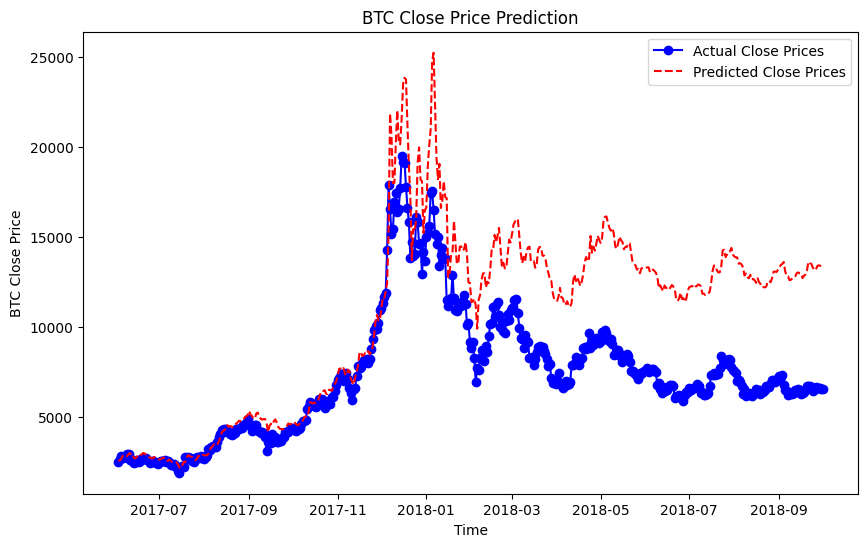

MSE: 17170290.6562, MAE: 3265.6259, R-squared: -0.3964


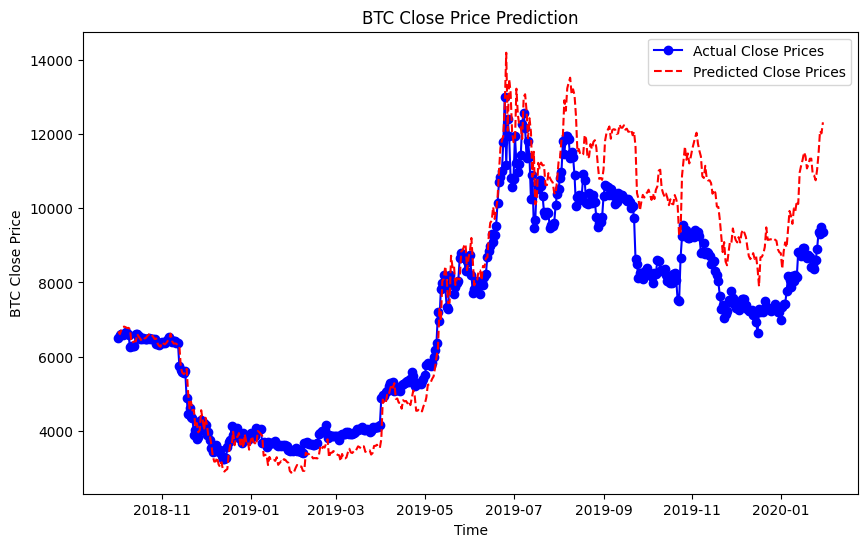

MSE: 1561997.8057, MAE: 956.5152, R-squared: 0.7564


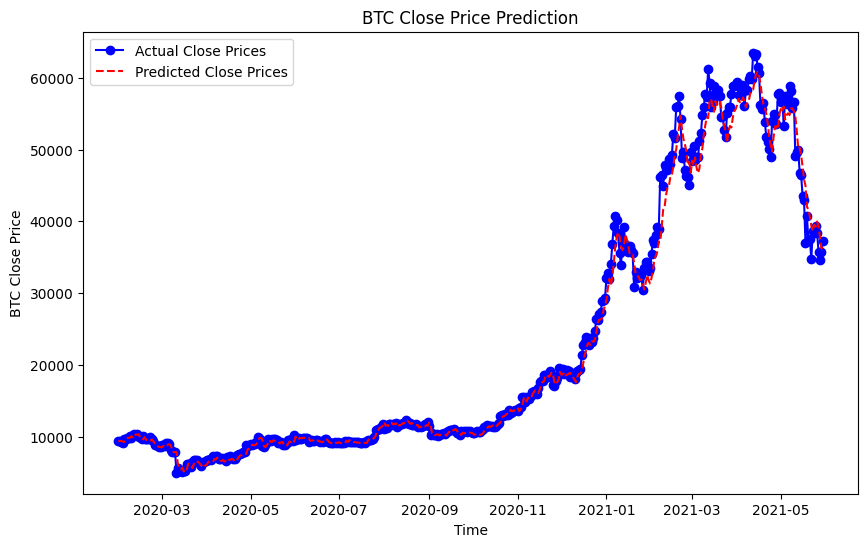

MSE: 3025801.3931, MAE: 1006.1633, R-squared: 0.9908


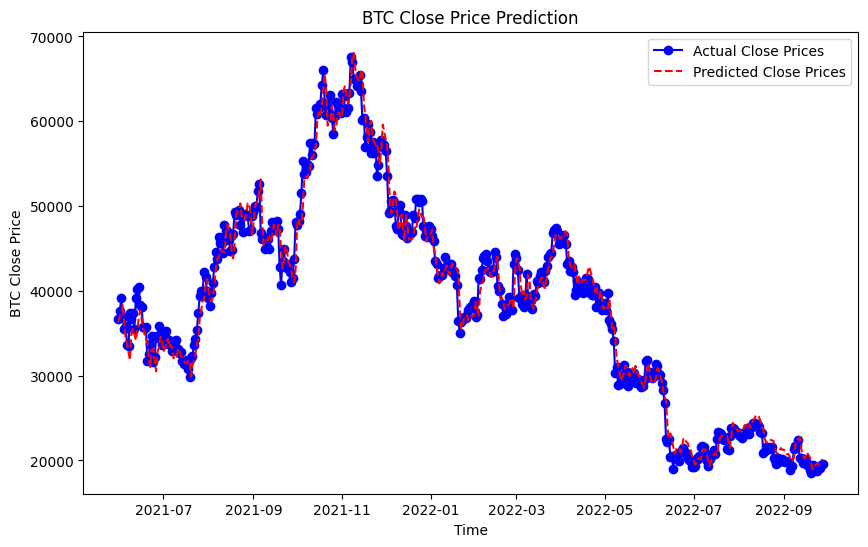

MSE: 2974860.8048, MAE: 1309.4413, R-squared: 0.9805


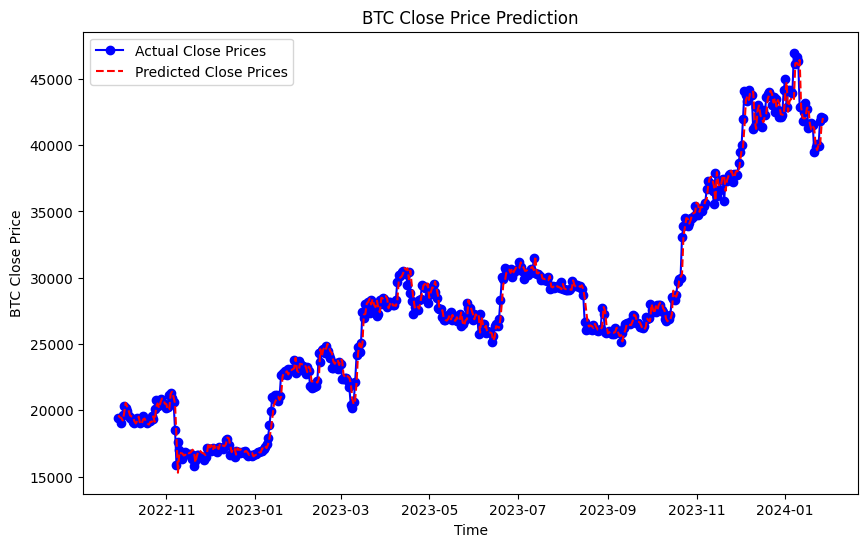

MSE: 510580.9432, MAE: 475.9946, R-squared: 0.9913


In [119]:
for train_index, test_index in tscv.split(X):
    #print(f"Train index: {train_index}")
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    lasso_model.fit(X_train, y_train)
    predictions = lasso_model.predict(X_test)

    # Visualize the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test.values, label='Actual Close Prices', color='blue', marker='o')
    plt.plot(y_test.index, predictions, label='Predicted Close Prices', color='red', linestyle='--')
    plt.title('BTC Close Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('BTC Close Price')
    plt.legend()
    plt.show()

    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, R-squared: {r2:.4f}")
    

In [120]:
dump(lasso_model, 'Lasso_for_close.joblib')

['Lasso_for_close.joblib']

In [121]:
loaded_model = load('Lasso_for_close.joblib')

In [122]:
last_row.drop('Close', axis = 1, inplace = True)

In [123]:
last_row

,Open,High,Low,Volume,Timestamp,Year,Month,Day,DayOfWeek,MA7_Close,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-28 00:00:00+00:00,42126.125,42797.175781,41696.910156,16858971687,1706400000,2024,1,28,6,40762.331473,...,-1.287497,-1.255979,-0.031517,-10.409506,-6.094961,-4.314544,41748.894608,-0.200524,-0.200726,11298.957592


In [124]:
loaded_model.predict(last_row)

array([42084.66782017])

In [51]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')

In [52]:
data_frame.tail()

,Date,Open,High,Low,Close,Volume,Timestamp,Year,Month,Day,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
2915,2024-01-24 00:00:00+00:00,39877.593750,40483.785156,39508.796875,40077.074219,22359526178,1706054400,2024,1,24,...,-1.886134,-0.776966,-1.109168,-4.961578,-2.901915,-2.059663,41957.001675,0.581052,0.579371,10767.858134
2916,2024-01-25 00:00:00+00:00,40075.550781,40254.480469,39545.664062,39933.808594,18491782013,1706140800,2024,1,25,...,-2.048163,-1.031205,-1.016957,-6.528654,-3.627263,-2.901391,41734.412385,-0.357475,-0.358116,10729.008230
2917,2024-01-26 00:00:00+00:00,39936.816406,42209.386719,39825.691406,41816.871094,25598119893,1706227200,2024,1,26,...,-1.789876,-1.182939,-0.606936,-5.324123,-3.966635,-1.357489,41737.048311,4.715459,4.607657,11239.645708
2918,2024-01-27 00:00:00+00:00,41815.625000,42195.632812,41431.281250,42120.054688,11422941934,1706313600,2024,1,27,...,-1.508742,-1.248100,-0.260642,-9.215087,-5.016325,-4.198761,41742.428744,0.725027,0.722411,11321.861198
2919,2024-01-28 00:00:00+00:00,42126.125000,42797.175781,41696.910156,42035.593750,16858971687,1706400000,2024,1,28,...,-1.287497,-1.255979,-0.031517,-10.409506,-6.094961,-4.314544,41748.894608,-0.200524,-0.200726,11298.957592


## Predict Open Price with Lasso (L1) regularization

In [66]:
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from joblib import dump, load

In [60]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')

In [61]:
data_frame['Date'] = pd.to_datetime(data_frame['Date'])

In [62]:
data_frame.set_index('Date', inplace = True)

In [63]:
data_frame['Open'] = data_frame['Open'].shift(-1)

In [64]:
last_row = data_frame.tail(1)

In [65]:
last_row

,Open,High,Low,Close,Volume,Timestamp,Year,Month,Day,DayOfWeek,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-28 00:00:00+00:00,NaN,42797.175781,41696.910156,42035.59375,16858971687,1706400000,2024,1,28,6,...,-1.287497,-1.255979,-0.031517,-10.409506,-6.094961,-4.314544,41748.894608,-0.200524,-0.200726,11298.957592


In [67]:
data_frame.drop(data_frame.index[-1],inplace = True)

In [68]:
y = data_frame['Open']

In [69]:
X = data_frame.drop('Open', axis = 1)

In [70]:
tscv = TimeSeriesSplit(n_splits=5)

In [71]:
lasso_model = Lasso(alpha=0.1)

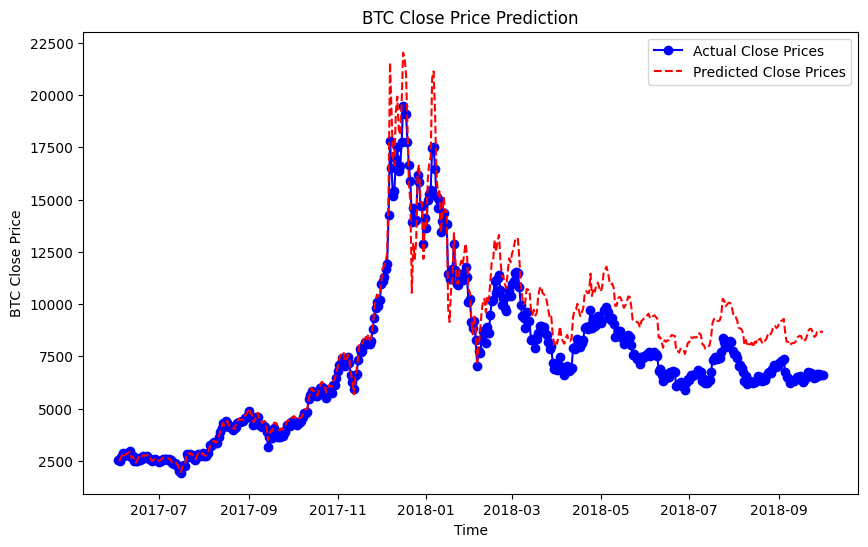

MSE: 1716199.2752, MAE: 1026.1130, R-squared: 0.8610


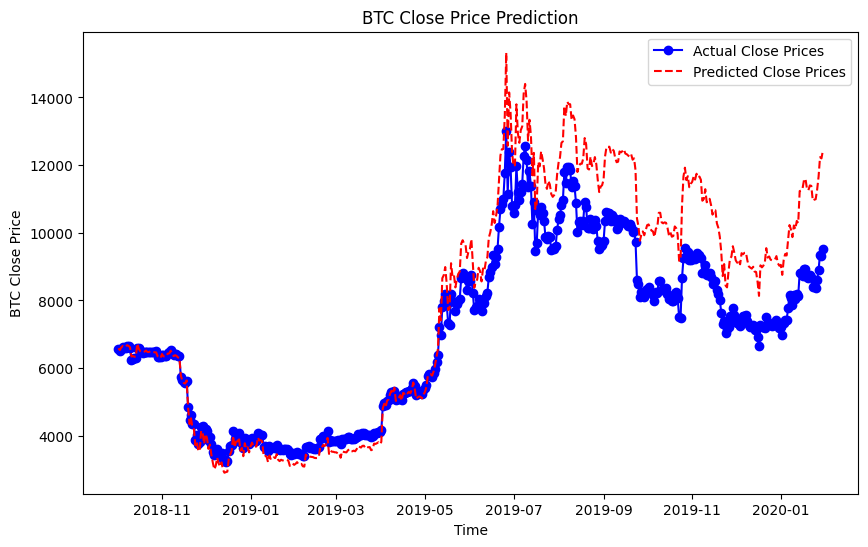

MSE: 1825776.5386, MAE: 1041.7275, R-squared: 0.7147


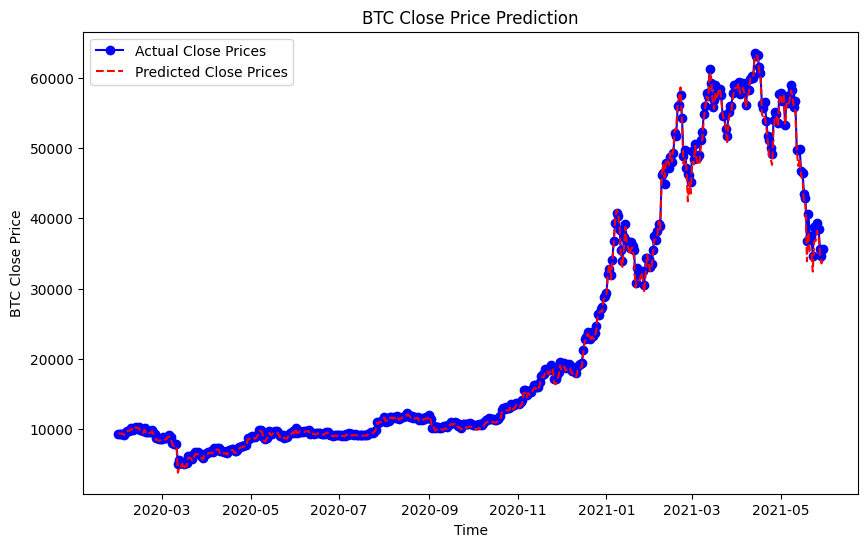

MSE: 408332.5374, MAE: 429.5190, R-squared: 0.9988


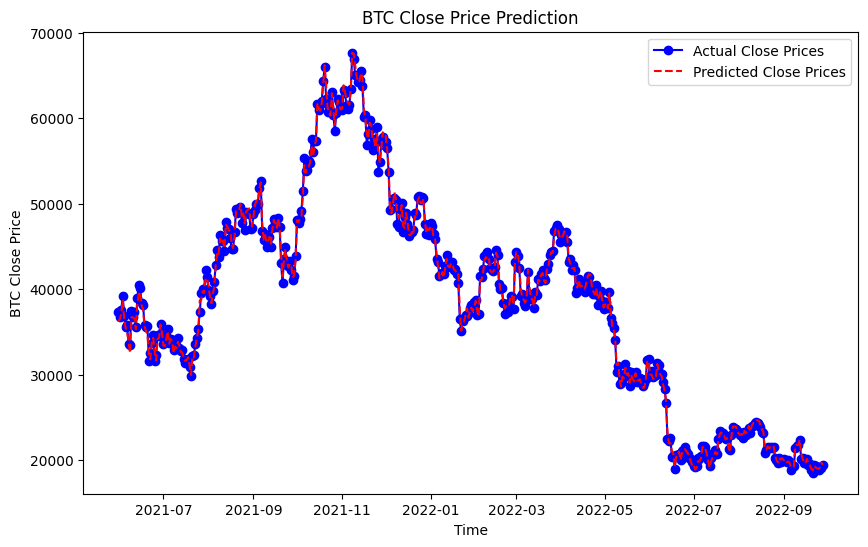

MSE: 189179.4341, MAE: 331.4867, R-squared: 0.9988


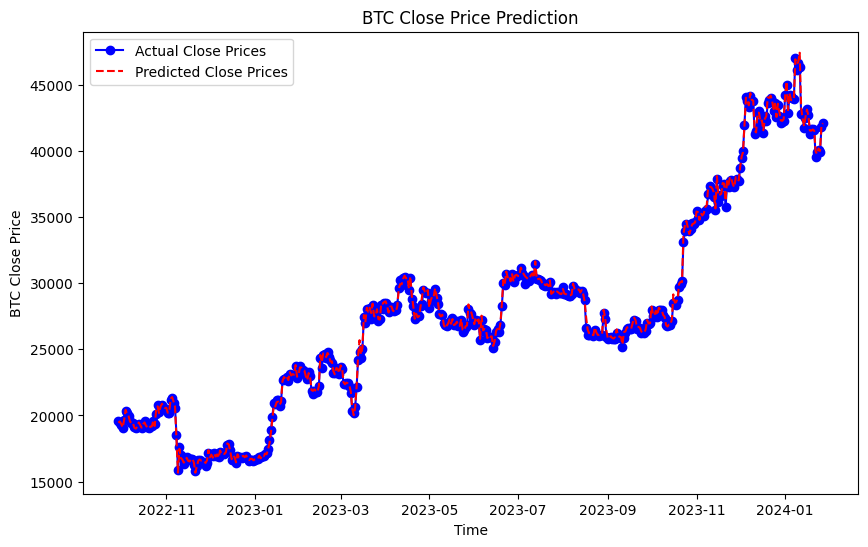

MSE: 28936.6599, MAE: 115.8601, R-squared: 0.9995


In [72]:
for train_index, test_index in tscv.split(X):
    #print(f"Train index: {train_index}")
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    lasso_model.fit(X_train, y_train)
    predictions = lasso_model.predict(X_test)

    # Visualize the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test.values, label='Actual Close Prices', color='blue', marker='o')
    plt.plot(y_test.index, predictions, label='Predicted Close Prices', color='red', linestyle='--')
    plt.title('BTC Close Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('BTC Close Price')
    plt.legend()
    plt.show()

    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, R-squared: {r2:.4f}")
    

In [73]:
dump(lasso_model, 'Lasso_for_open.joblib')

['Lasso_for_open.joblib']

In [74]:
loaded_model = load('Lasso_for_open.joblib')

In [75]:
last_row.drop('Open', axis = 1, inplace = True)

In [76]:
last_row

,High,Low,Close,Volume,Timestamp,Year,Month,Day,DayOfWeek,MA7_Close,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
Date,,,,,,,,,,,,,,,,,,,,,
2024-01-28 00:00:00+00:00,42797.175781,41696.910156,42035.59375,16858971687,1706400000,2024,1,28,6,40762.331473,...,-1.287497,-1.255979,-0.031517,-10.409506,-6.094961,-4.314544,41748.894608,-0.200524,-0.200726,11298.957592


In [77]:
loaded_model.predict(last_row)

array([42261.868016])

In [78]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')

In [79]:
data_frame.tail()

,Date,Open,High,Low,Close,Volume,Timestamp,Year,Month,Day,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
2915,2024-01-24 00:00:00+00:00,39877.593750,40483.785156,39508.796875,40077.074219,22359526178,1706054400,2024,1,24,...,-1.886134,-0.776966,-1.109168,-4.961578,-2.901915,-2.059663,41957.001675,0.581052,0.579371,10767.858134
2916,2024-01-25 00:00:00+00:00,40075.550781,40254.480469,39545.664062,39933.808594,18491782013,1706140800,2024,1,25,...,-2.048163,-1.031205,-1.016957,-6.528654,-3.627263,-2.901391,41734.412385,-0.357475,-0.358116,10729.008230
2917,2024-01-26 00:00:00+00:00,39936.816406,42209.386719,39825.691406,41816.871094,25598119893,1706227200,2024,1,26,...,-1.789876,-1.182939,-0.606936,-5.324123,-3.966635,-1.357489,41737.048311,4.715459,4.607657,11239.645708
2918,2024-01-27 00:00:00+00:00,41815.625000,42195.632812,41431.281250,42120.054688,11422941934,1706313600,2024,1,27,...,-1.508742,-1.248100,-0.260642,-9.215087,-5.016325,-4.198761,41742.428744,0.725027,0.722411,11321.861198
2919,2024-01-28 00:00:00+00:00,42126.125000,42797.175781,41696.910156,42035.593750,16858971687,1706400000,2024,1,28,...,-1.287497,-1.255979,-0.031517,-10.409506,-6.094961,-4.314544,41748.894608,-0.200524,-0.200726,11298.957592


## Predict Close Price with Ridge (L2) regularization

In [80]:
from sklearn.linear_model import Ridge

In [81]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')
data_frame['Date'] = pd.to_datetime(data_frame['Date'])
data_frame.set_index('Date', inplace = True)
data_frame['Close'] = data_frame['Close'].shift(-1)
last_row = data_frame.tail(1)
data_frame.drop(data_frame.index[-1],inplace = True)

In [82]:
y = data_frame['Close']
X = data_frame.drop('Close', axis = 1)
tscv = TimeSeriesSplit(n_splits=5)
ridge_model = Ridge(alpha=0.1)

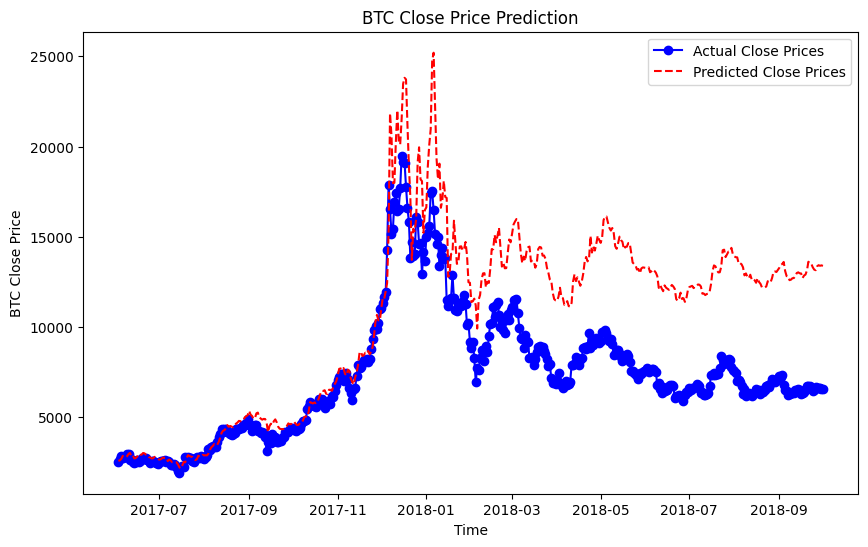

MSE: 17163866.3109, MAE: 3265.1723, R-squared: -0.3959


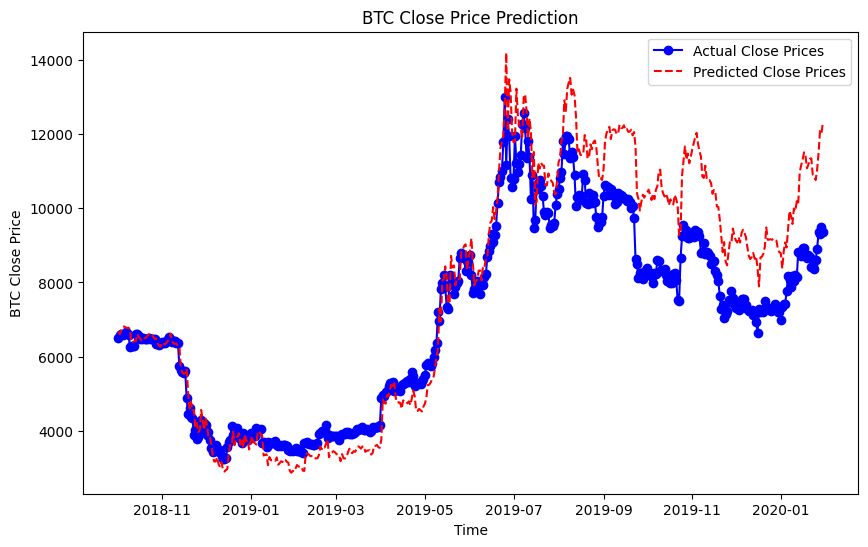

MSE: 1560917.0262, MAE: 956.0734, R-squared: 0.7565


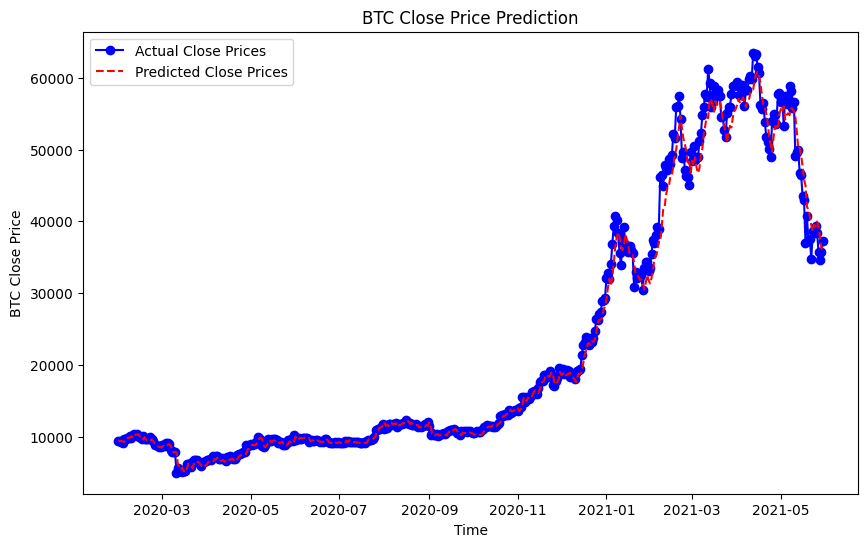

MSE: 3025367.1375, MAE: 1006.0215, R-squared: 0.9908


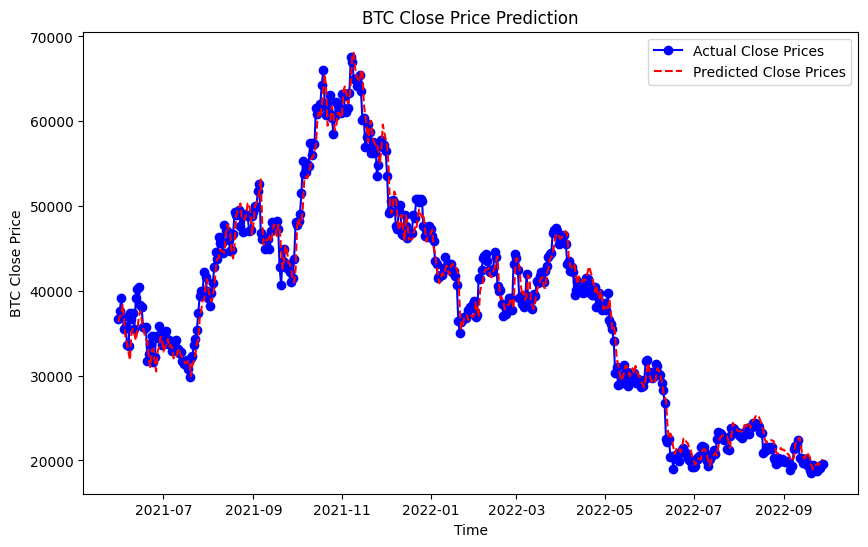

MSE: 2975265.9260, MAE: 1309.4827, R-squared: 0.9805


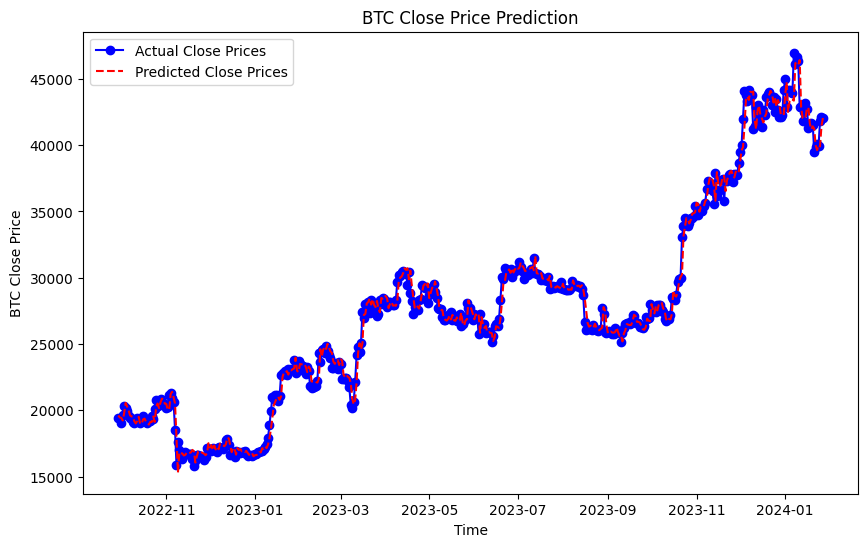

MSE: 510192.2645, MAE: 475.1914, R-squared: 0.9913


In [83]:
for train_index, test_index in tscv.split(X):
    #print(f"Train index: {train_index}")
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    lasso_model.fit(X_train, y_train)
    predictions = lasso_model.predict(X_test)

    # Visualize the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test.values, label='Actual Close Prices', color='blue', marker='o')
    plt.plot(y_test.index, predictions, label='Predicted Close Prices', color='red', linestyle='--')
    plt.title('BTC Close Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('BTC Close Price')
    plt.legend()
    plt.show()

    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, R-squared: {r2:.4f}")
    

In [84]:
dump(lasso_model, 'Ridge_for_close.joblib')
loaded_model = load('Ridge_for_close.joblib')
last_row.drop('Close', axis = 1, inplace = True)



In [85]:
loaded_model.predict(last_row)


array([42079.32530013])

In [86]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')


In [87]:
data_frame.tail()

,Date,Open,High,Low,Close,Volume,Timestamp,Year,Month,Day,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
2915,2024-01-24 00:00:00+00:00,39877.593750,40483.785156,39508.796875,40077.074219,22359526178,1706054400,2024,1,24,...,-1.886134,-0.776966,-1.109168,-4.961578,-2.901915,-2.059663,41957.001675,0.581052,0.579371,10767.858134
2916,2024-01-25 00:00:00+00:00,40075.550781,40254.480469,39545.664062,39933.808594,18491782013,1706140800,2024,1,25,...,-2.048163,-1.031205,-1.016957,-6.528654,-3.627263,-2.901391,41734.412385,-0.357475,-0.358116,10729.008230
2917,2024-01-26 00:00:00+00:00,39936.816406,42209.386719,39825.691406,41816.871094,25598119893,1706227200,2024,1,26,...,-1.789876,-1.182939,-0.606936,-5.324123,-3.966635,-1.357489,41737.048311,4.715459,4.607657,11239.645708
2918,2024-01-27 00:00:00+00:00,41815.625000,42195.632812,41431.281250,42120.054688,11422941934,1706313600,2024,1,27,...,-1.508742,-1.248100,-0.260642,-9.215087,-5.016325,-4.198761,41742.428744,0.725027,0.722411,11321.861198
2919,2024-01-28 00:00:00+00:00,42126.125000,42797.175781,41696.910156,42035.593750,16858971687,1706400000,2024,1,28,...,-1.287497,-1.255979,-0.031517,-10.409506,-6.094961,-4.314544,41748.894608,-0.200524,-0.200726,11298.957592


## Predict Open Price with Ridge (L2) regularization

In [88]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')
data_frame['Date'] = pd.to_datetime(data_frame['Date'])
data_frame.set_index('Date', inplace = True)
data_frame['Open'] = data_frame['Open'].shift(-1)
last_row = data_frame.tail(1)
data_frame.drop(data_frame.index[-1],inplace = True)

In [89]:
y = data_frame['Open']
X = data_frame.drop('Open', axis = 1)
tscv = TimeSeriesSplit(n_splits=5)
ridge_model = Ridge(alpha=0.1)

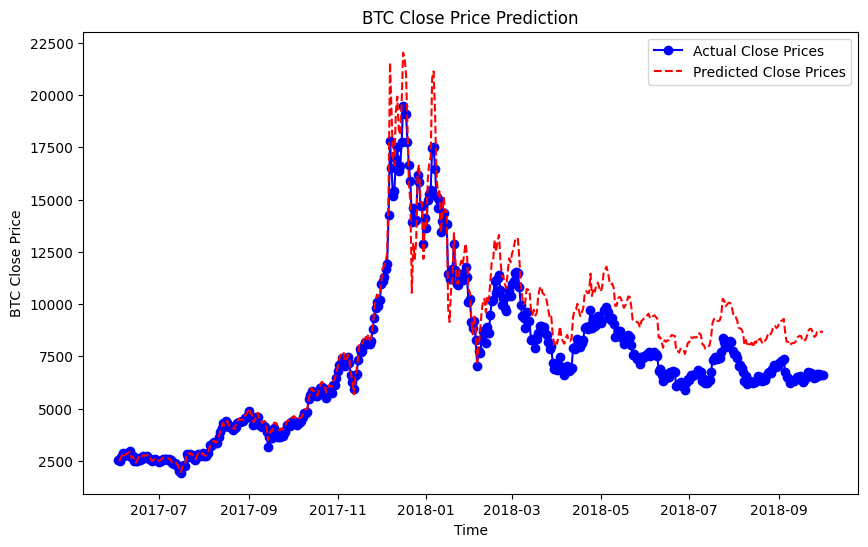

MSE: 1716199.2752, MAE: 1026.1130, R-squared: 0.8610


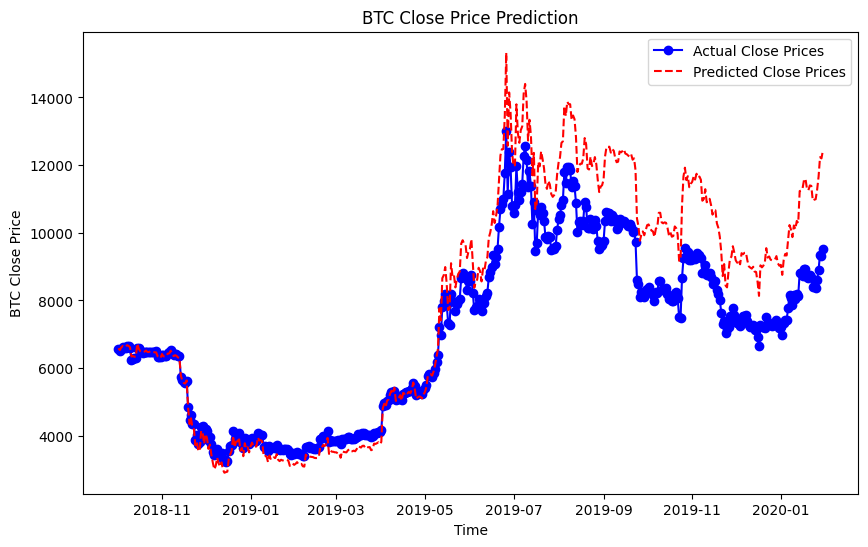

MSE: 1825776.5386, MAE: 1041.7275, R-squared: 0.7147


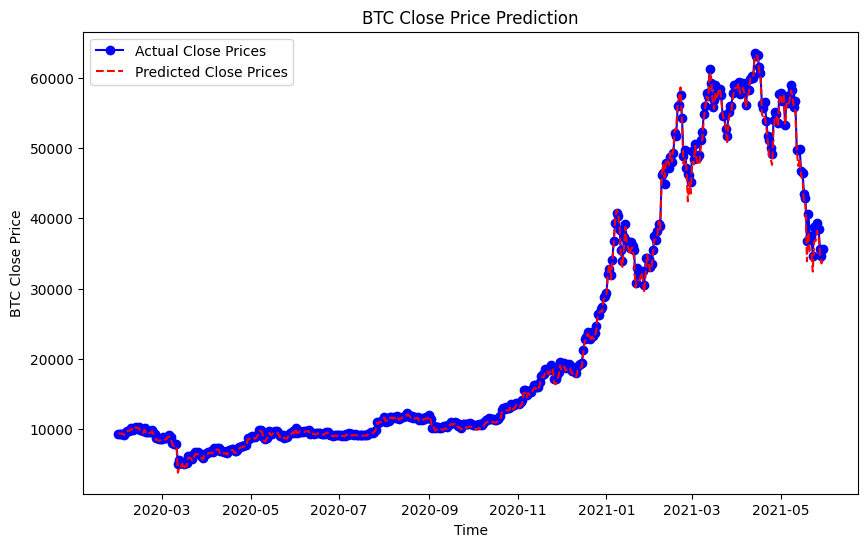

MSE: 408332.5374, MAE: 429.5190, R-squared: 0.9988


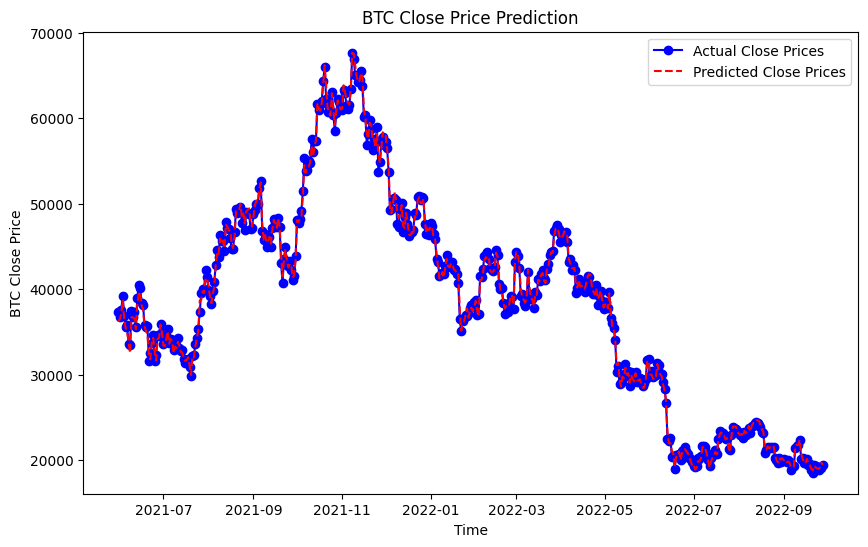

MSE: 189179.4341, MAE: 331.4867, R-squared: 0.9988


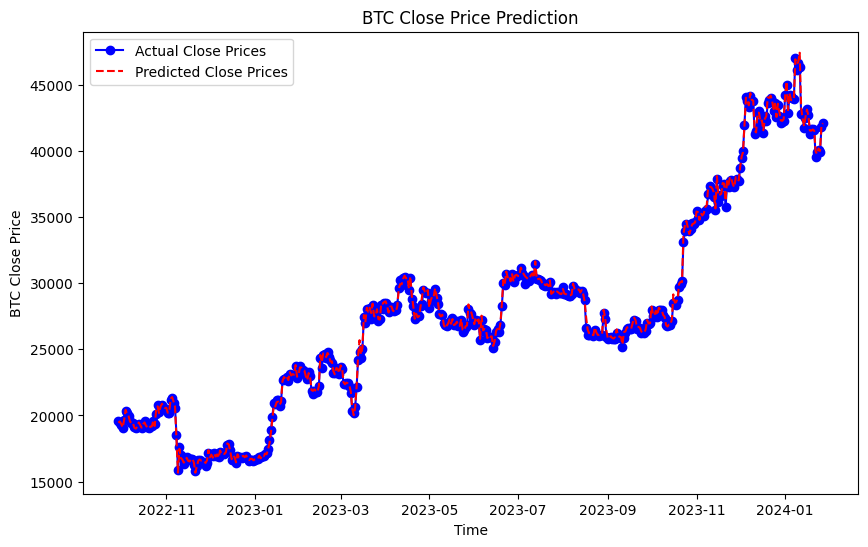

MSE: 28936.6599, MAE: 115.8601, R-squared: 0.9995


In [90]:
for train_index, test_index in tscv.split(X):
    #print(f"Train index: {train_index}")
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    lasso_model.fit(X_train, y_train)
    predictions = lasso_model.predict(X_test)

    # Visualize the actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test.values, label='Actual Close Prices', color='blue', marker='o')
    plt.plot(y_test.index, predictions, label='Predicted Close Prices', color='red', linestyle='--')
    plt.title('BTC Close Price Prediction')
    plt.xlabel('Time')
    plt.ylabel('BTC Close Price')
    plt.legend()
    plt.show()

    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    print(f"MSE: {mse:.4f}, MAE: {mae:.4f}, R-squared: {r2:.4f}")

In [91]:
dump(lasso_model, 'Ridge_for_close.joblib')
loaded_model = load('Ridge_for_close.joblib')
last_row.drop('Open', axis = 1, inplace = True)

In [92]:
loaded_model.predict(last_row)

array([42261.868016])

In [93]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')

In [94]:
data_frame.tail()

,Date,Open,High,Low,Close,Volume,Timestamp,Year,Month,Day,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
2915,2024-01-24 00:00:00+00:00,39877.593750,40483.785156,39508.796875,40077.074219,22359526178,1706054400,2024,1,24,...,-1.886134,-0.776966,-1.109168,-4.961578,-2.901915,-2.059663,41957.001675,0.581052,0.579371,10767.858134
2916,2024-01-25 00:00:00+00:00,40075.550781,40254.480469,39545.664062,39933.808594,18491782013,1706140800,2024,1,25,...,-2.048163,-1.031205,-1.016957,-6.528654,-3.627263,-2.901391,41734.412385,-0.357475,-0.358116,10729.008230
2917,2024-01-26 00:00:00+00:00,39936.816406,42209.386719,39825.691406,41816.871094,25598119893,1706227200,2024,1,26,...,-1.789876,-1.182939,-0.606936,-5.324123,-3.966635,-1.357489,41737.048311,4.715459,4.607657,11239.645708
2918,2024-01-27 00:00:00+00:00,41815.625000,42195.632812,41431.281250,42120.054688,11422941934,1706313600,2024,1,27,...,-1.508742,-1.248100,-0.260642,-9.215087,-5.016325,-4.198761,41742.428744,0.725027,0.722411,11321.861198
2919,2024-01-28 00:00:00+00:00,42126.125000,42797.175781,41696.910156,42035.593750,16858971687,1706400000,2024,1,28,...,-1.287497,-1.255979,-0.031517,-10.409506,-6.094961,-4.314544,41748.894608,-0.200524,-0.200726,11298.957592


In [95]:
data_frame = pd.read_csv('data/data_BTC-USD.csv')

In [98]:
data_frame.shift(1)

,Date,Open,High,Low,Close,Volume,Timestamp,Year,Month,Day,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
0,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-31 00:00:00+00:00,378.292999,380.346985,367.834991,368.766998,3.789430e+07,1.454198e+09,2016.0,1.0,31.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,0.231640,0.162251,0.000000
2,2016-02-01 00:00:00+00:00,369.350006,378.071991,367.957001,373.056000,5.165670e+07,1.454285e+09,2016.0,2.0,1.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,1.163065,1.156354,1.163065
3,2016-02-02 00:00:00+00:00,372.920013,375.882996,372.920013,374.447998,4.037870e+07,1.454371e+09,2016.0,2.0,2.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,0.373134,0.372439,1.540539
4,2016-02-03 00:00:00+00:00,374.645996,374.950012,368.045013,369.949005,4.593340e+07,1.454458e+09,2016.0,2.0,3.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,-1.201500,-1.208776,0.320529
5,2016-02-04 00:00:00+00:00,370.174011,391.608002,369.993011,389.593994,6.928550e+07,1.454544e+09,2016.0,2.0,4.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,5.310188,5.173998,5.647739
6,2016-02-05 00:00:00+00:00,388.898010,391.093994,385.571991,386.549011,4.382500e+07,1.454630e+09,2016.0,2.0,5.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,-0.781579,-0.784649,4.822019
7,2016-02-06 00:00:00+00:00,386.588989,386.631012,372.386993,376.522003,4.924930e+07,1.454717e+09,2016.0,2.0,6.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,-2.593981,-2.628218,2.102955
8,2016-02-07 00:00:00+00:00,376.514008,380.871002,374.903015,376.619995,3.707630e+07,1.454803e+09,2016.0,2.0,7.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,0.026026,0.026022,2.129528
9,2016-02-08 00:00:00+00:00,376.756989,379.878998,373.334015,373.446991,4.767110e+07,1.454890e+09,2016.0,2.0,8.0,...,0.935218,0.934901,-0.006186,0.689827,0.693018,-0.017092,17412.750787,-0.842495,-0.846064,1.269092
